<img src='../OUTILS/bandeau_MF.png' align='right' width='100%'/>

<div class="alert alert-info alert-success">
<h3>Élaboration d'image composite MTG / FCI avec SATPY </h3></div>

## <a id='TOC-TOP'></a>Contenus

<div class="alert alert-block alert-warning">
    
<b>PREREQUIS </b>
    
Ce Notebook ne nécessite pas de prérequis. 
Le kernel "env_MF_teledetection" doit être utilisé

</div>
<hr>

SatPy

Il s'agit d'une bibliothèque Python pour le traitement des données des satellites météorologiques

Satpy permet de lire, manipuler et écrire des données issues d'instruments satellites météorologiques d'observation de la Terre.

Satpy fournit la possibilité de lire les données de différents formats (readers) et de manipuler les paramètres géophysiques de ces différents formats de fichiers.

Satpy fournit également des interfaces pour créer des images RVB (rouge/vert/bleu) qui combinent les données de plusieurs bandes d'instruments ou produits.

Diverses corrections atmosphériques et améliorations visuelles sont fournies pour améliorer le rendu et la qualité des images de sortie. Les données de sortie peuvent être écrites dans plusieurs formats de fichiers tels que les fichiers NetCDF, PNG et GeoTIFF.

Satpy permet également aux utilisateurs de rééchantillonner les données sur des grilles géographiques projetées (zones).

Pour obtenir de la documentation sur Satpy, quelques exemples, et un tutoriel de démarrage rapide : https://satpy.readthedocs.io/en/latest/index.html

<div class="alert alert-info" role="alert">

### <a id='section1'></a>1.Tout d'abord, il faut procéder à l'importation des librairies nécessaires.

</div>

In [1]:
from satpy.scene import Scene
from satpy import find_files_and_readers
from datetime import datetime
import sys
from pyresample.geometry import AreaDefinition
import numpy as np
import os
from osgeo import gdal
from PIL import Image
import subprocess
from IPython.display import display,HTML
os.environ['PATH'] = f"/opt/conda/env_MF_teledetection/bin:{os.environ['PATH']}" 
os.environ['PATH'] = f"~/.conda/envs/env_MF_teledetection/bin:{os.environ['PATH']}"
os.environ['GDAL_DATA'] = '/opt/conda/env_MF_teledetection/share/gdal'
os.environ['PROJ_LIB'] = '/opt/conda/env_MF_teledetection/share/proj'

<div class="alert alert-info" role="alert">
    
### <a id='section2'></a>2.Définition du produit, date et heure, reader, et répertoires.

</div>

### Données d'entrée : fichiers chunk mtg (40) 
Pour télécharger d'autres fichiers, Cf. Jupyter Notebook  <a href="eumdac.ipynb" target="_blank"> Eumdac : téléchargement de données MTG</a></br>

In [2]:
input = '/stockage/DATA/202509271200/'

In [3]:
cd ~/MF_DATA_MANIPULATION

/home/coster/MF_DATA_MANIPULATION


In [4]:
download_dir = os.path.join(os.getcwd(), "RESULTS")
os.makedirs(download_dir, exist_ok=True)

In [5]:
output='RESULTS'

In [6]:
!ls $input

W_XX-EUMETSAT-Darmstadt,IMG+SAT,MTI1+FCI-1C-RRAD-FDHSI-FD--CHK-BODY---NC4E_C_EUMT_20250927120425_IDPFI_OPE_20250927120006_20250927120022_N__O_0073_0001.nc
W_XX-EUMETSAT-Darmstadt,IMG+SAT,MTI1+FCI-1C-RRAD-FDHSI-FD--CHK-BODY---NC4E_C_EUMT_20250927120442_IDPFI_OPE_20250927120006_20250927120035_N__O_0073_0002.nc
W_XX-EUMETSAT-Darmstadt,IMG+SAT,MTI1+FCI-1C-RRAD-FDHSI-FD--CHK-BODY---NC4E_C_EUMT_20250927120457_IDPFI_OPE_20250927120011_20250927120049_N__O_0073_0003.nc
W_XX-EUMETSAT-Darmstadt,IMG+SAT,MTI1+FCI-1C-RRAD-FDHSI-FD--CHK-BODY---NC4E_C_EUMT_20250927120506_IDPFI_OPE_20250927120022_20250927120056_N__O_0073_0004.nc
W_XX-EUMETSAT-Darmstadt,IMG+SAT,MTI1+FCI-1C-RRAD-FDHSI-FD--CHK-BODY---NC4E_C_EUMT_20250927120516_IDPFI_OPE_20250927120028_20250927120111_N__O_0073_0005.nc
W_XX-EUMETSAT-Darmstadt,IMG+SAT,MTI1+FCI-1C-RRAD-FDHSI-FD--CHK-BODY---NC4E_C_EUMT_20250927120526_IDPFI_OPE_20250927120042_20250927120128_N__O_0073_0006.nc
W_XX-EUMETSAT-Darmstadt,IMG+SAT,MTI1+FCI-1C-RRAD-FDHSI-FD--CHK-BODY---

### SATPY permet de produire notamment des RGB, parmi les suivantes
airmass </br> ash </br>cimss_cloud_type</br> cloud_phase</br> cloudtop</br> convection</br> day_microphysics</br> dust</br> fog</br>  natural_color</br> night_fog</br> night_microphysics</br>  true_color</br> 

Définition du produit

In [7]:
composite_name = "true_color"

### Définition de la date et heure de la composite à créer
(202401091200 disponible par défaut)

In [8]:
annee='2025'
mois='09'
jour='27'
heure='12'

In [9]:
yyyy=int(annee)
mm=int(mois)
dd=int(jour)
hh_debut=int(heure)
min_debut=int('00')
hh_fin=int(heure)
min_fin=int('10')

### Définition du reader

In [10]:
reader_to_use = "fci_l1c_nc"

In [11]:
filename = (output + '/RGB_satpy_' + composite_name )

In [12]:
myfiles = find_files_and_readers(base_dir=input,
                                 start_time=datetime(yyyy,mm,dd,hh_debut,min_debut),
                                 end_time=datetime(yyyy,mm,dd,hh_fin,min_fin),
                                 reader=reader_to_use)

In [13]:
scn = Scene(filenames=myfiles)

### Liste de toutes les composites disponibles

In [14]:
print(scn.available_composite_names())

['24h_microphysics', 'airmass', 'ash', 'cimss_cloud_type', 'cimss_cloud_type_raw', 'cloud_phase', 'cloud_phase_distinction', 'cloud_phase_distinction_raw', 'cloud_phase_raw', 'cloud_phase_with_night_ir105', 'cloud_type', 'cloud_type_with_night_ir105', 'cloudtop', 'colorized_ir_clouds', 'convection', 'day_essl_colorized_low_level_moisture', 'day_essl_low_level_moisture', 'day_microphysics', 'day_severe_storms', 'day_severe_storms_tropical', 'dust', 'essl_colorized_low_level_moisture', 'essl_low_level_moisture', 'fci_fire_channels_sum', 'fire_temperature', 'fire_temperature_38refl', 'fire_temperature_rad', 'flames_masked', 'fog', 'geo_color', 'geo_color_background_with_low_clouds', 'geo_color_high_clouds', 'geo_color_low_clouds', 'geo_color_night', 'green_snow', 'hrv_clouds', 'ir108_3d', 'ir_cloud_day', 'ir_sandwich', 'ir_sandwich_with_night_colorized_ir_clouds', 'natural_color', 'natural_color_raw', 'ndvi_hybrid_green', 'ndvi_hybrid_green_fully_sunzencorrected', 'ndvi_hybrid_green_raw',

<div class="alert alert-info" role="alert">
    
### <a id='section2'></a>3.Création du produit.

</div>

In [15]:
scn.load([composite_name], upper_right_corner='NE')

/home/coster/.conda/envs/env_MF_teledetection/lib/python3.10/site-packages/dask/array/core.py:813: FutureWarning: The `token=` keyword to `map_blocks` has been moved to `name=`. Please use `name=` instead as the `token=` keyword will be removed in a future release.
  warnings.warn(
/home/coster/.conda/envs/env_MF_teledetection/lib/python3.10/site-packages/dask/array/core.py:813: FutureWarning: The `token=` keyword to `map_blocks` has been moved to `name=`. Please use `name=` instead as the `token=` keyword will be removed in a future release.
  warnings.warn(
/home/coster/.conda/envs/env_MF_teledetection/lib/python3.10/site-packages/dask/array/core.py:813: FutureWarning: The `token=` keyword to `map_blocks` has been moved to `name=`. Please use `name=` instead as the `token=` keyword will be removed in a future release.
  warnings.warn(


Ne pas tenir compte des avertissements

In [16]:
natscn = scn.resample(scn.coarsest_area(), resampler='nearest')

In [17]:
natscn.save_dataset(composite_name, filename=filename + '.tif')

La création du tif peut prendre quelques dizaines de secondes (~ 200 Mo pour un plein disque à 1 km soit 11136x11136 pixels)

In [18]:
!identify -quiet {filename}.tif

RESULTS/RGB_satpy_true_color.tif TIFF 11136x11136 11136x11136+0+0 8-bit sRGB 191.041MiB 0.000u 0:00.000


### Défnition de la taille de l'image globe (pixels)

In [19]:
!gdalwarp -overwrite -ts 1800 1800 {filename}.tif {filename}_redim.tif

Using band 4 of source image as alpha.
Creating output file that is 1800P x 1800L.
Processing RESULTS/RGB_satpy_true_color.tif [1/1] : 0...10...20...30...40...50...60...70...80...90...100 - done.


In [20]:
taille_redim=600  # si nécessaire pour affichage plus léger, 1800x1800 par défaut

In [21]:
!convert  {filename}_redim.tif {filename}_redim_HD.jpg > /dev/null 2>&1
!convert -resize {taille_redim} {filename}_redim.tif {filename}_redim.jpg > /dev/null 2>&1

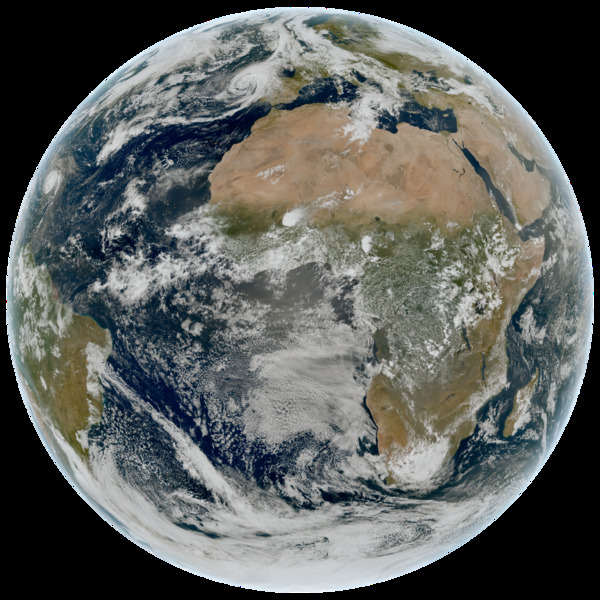

In [22]:
imgredim = Image.open(filename + '_redim.jpg')
display(imgredim)

Découpe de la partie plein disque

In [23]:
!convert -size 1800x1800 xc:black -fill white -draw "circle 900,900 900,29" mask.png

In [24]:
!convert {filename}_redim_HD.jpg mask.png -alpha off -compose CopyOpacity -composite -alpha on {filename}_redim_HD.png

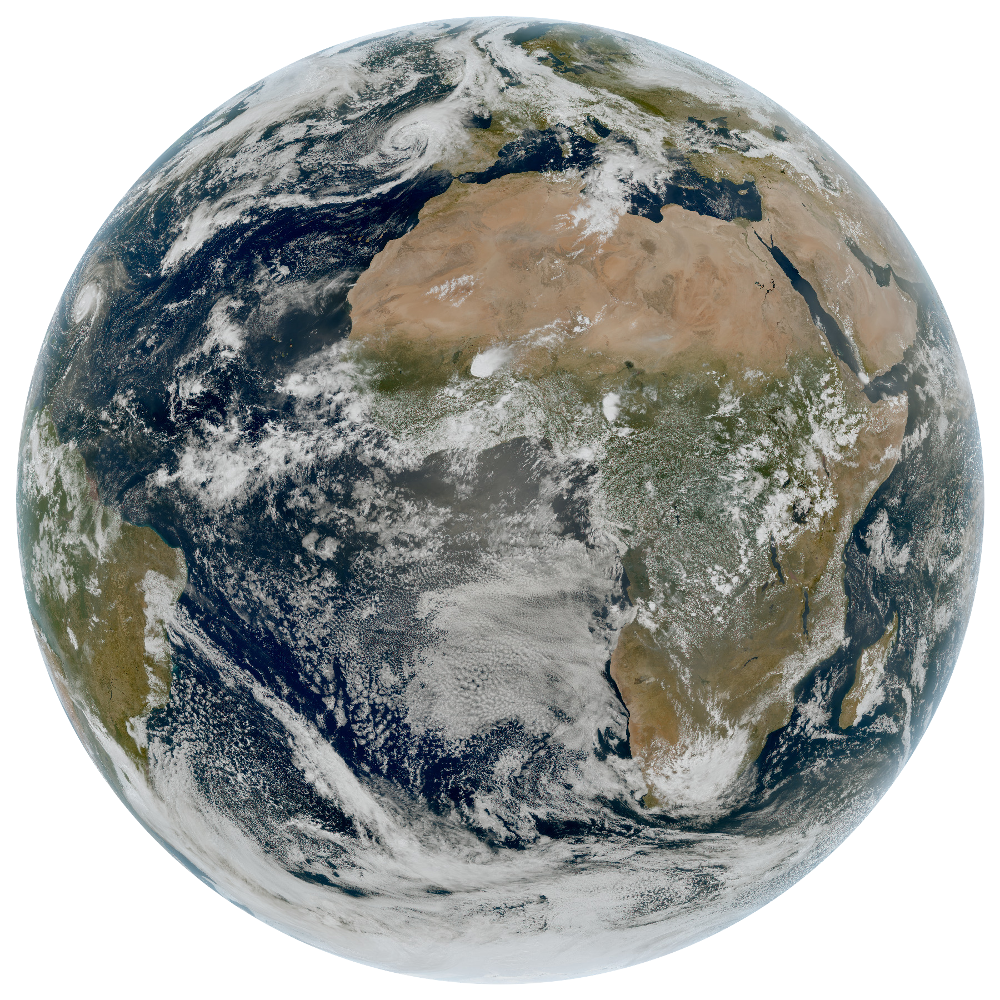

In [25]:
imgredim_png = Image.open(filename + '_redim_HD.png')
display(imgredim_png)

Quelques liens utiles: </br>
<img src='../OUTILS/icon_pdf.png' alt='icon pdf' width='30px'></img><a href="../DOCS/Fiches_produits_MTG_legendes-RGB.pdf" target="_blank"> Principales légendes des produits RGB</a>


<div class="alert alert-info" role="alert">
    
### <a id='section2'></a>4.Pour aller plus loin, essayons de comprendre l'image que nous voyons, en extrayant les 3 bandes de ce produits RGB

</div>

In [26]:
!gdal_translate -q -b 1 {filename}_redim.tif {filename}_redim_bande_rouge.tif
!gdal_translate -q -b 2 {filename}_redim.tif {filename}_redim_bande_verte.tif
!gdal_translate -q -b 3 {filename}_redim.tif {filename}_redim_bande_bleue.tif
!convert -resize 300 {filename}_redim_bande_rouge.tif {filename}_redim_bande_rouge.jpg > /dev/null 2>&1
!convert -resize 300 {filename}_redim_bande_verte.tif {filename}_redim_bande_verte.jpg > /dev/null 2>&1
!convert -resize 300 {filename}_redim_bande_bleue.tif {filename}_redim_bande_bleue.jpg > /dev/null 2>&1

Affichage des 3 images RGB Rouge Verte Bleue

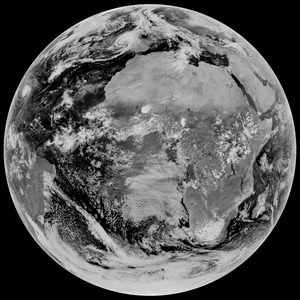

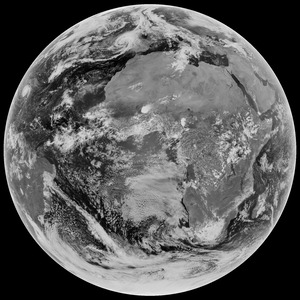

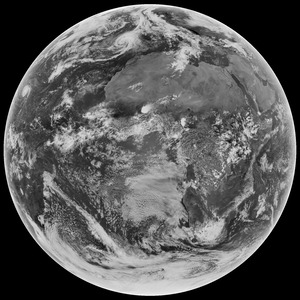

In [27]:
imgrouge = Image.open(filename + '_redim_bande_rouge.jpg')
display(imgrouge)
imgverte = Image.open(filename + '_redim_bande_verte.jpg')
display(imgverte)
imgbleue = Image.open(filename + '_redim_bande_bleue.jpg')
display(imgbleue)

Pour l'exemple du produit Cloud Type RGB, les 3 bandes RGB sont celles respectivement associées aux canaux NIR1.38, VIS0.64 et NIR1.61 comme indiqué dans le document ci-dessous

### Document de synthèse des produits RGB FCI 

## &emsp;&emsp;&emsp;<a href="../DOCS/mtg_fci_synthese_produits.pdf" target="_blank"><img src='../DOCS/mtg_fci_synthese_produits.jpg' alt='tableau synthèse' width='500px'>  </a>

Autres exemples de visualisation d'un image composite rgb en 3 bandes rouge vert bleu : <a href="http://jupyter.fr-mf-general.s.ewcloud.host/user/coster/files/MF_DATA_MANIPULATION/DOCS/doc_mtg_fci_rgb_bande.html" title="lien "  > Ouvrir la page web de présentation ici</a>

### Ajout des frontières

In [28]:
# Chemins vers les fichiers shapefile contenant les frontieres des pays : '../OUTILS/boundary/world-administrative-boundaries.shp' 

In [29]:
#!gdal_rasterize -q -b 1 -burn 240 -b 2 -burn 240 -b 3 -burn 240 -l world-administrative-boundaries OUTILS/boundary/world-administrative-boundaries.shp {filename}.tif >/dev/null 2>&1 # frontière blanche
!gdal_rasterize -q -b 1 -burn 255 -b 2 -burn 0 -b 3 -burn 0 -l world-administrative-boundaries OUTILS/boundary/world-administrative-boundaries.shp {filename}.tif >/dev/null 2>&1 # frontière rouge

### Affichage de l'image globe dans le jupyter notebook

Redimensionnement de l'image pour un affichage plus rapide

In [30]:
!convert -resize 800 {filename}.tif {filename}_min.jpg > /dev/null 2>&1

In [31]:
!ls -lrth {filename}.tif {filename}_min.jpg

-rw-r--r--. 1 coster coster 198M Oct  2 14:25 RESULTS/RGB_satpy_true_color.tif
-rw-r--r--. 1 coster coster 255K Oct  2 14:25 RESULTS/RGB_satpy_true_color_min.jpg


In [32]:
!identify {filename}.tif {filename}_min.jpg

RESULTS/RGB_satpy_true_color.tif TIFF 11136x11136 11136x11136+0+0 8-bit sRGB 197.508MiB 0.000u 0:00.000
RESULTS/RGB_satpy_true_color_min.jpg JPEG 800x800 800x800+0+0 8-bit sRGB 260313B 0.000u 0:00.000
identify: Unknown field with tag 33550 (0x830e) encountered. `TIFFReadDirectory' @ warning/tiff.c/TIFFWarnings/928.
identify: Unknown field with tag 33922 (0x8482) encountered. `TIFFReadDirectory' @ warning/tiff.c/TIFFWarnings/928.
identify: Unknown field with tag 34735 (0x87af) encountered. `TIFFReadDirectory' @ warning/tiff.c/TIFFWarnings/928.
identify: Unknown field with tag 34736 (0x87b0) encountered. `TIFFReadDirectory' @ warning/tiff.c/TIFFWarnings/928.
identify: Unknown field with tag 34737 (0x87b1) encountered. `TIFFReadDirectory' @ warning/tiff.c/TIFFWarnings/928.


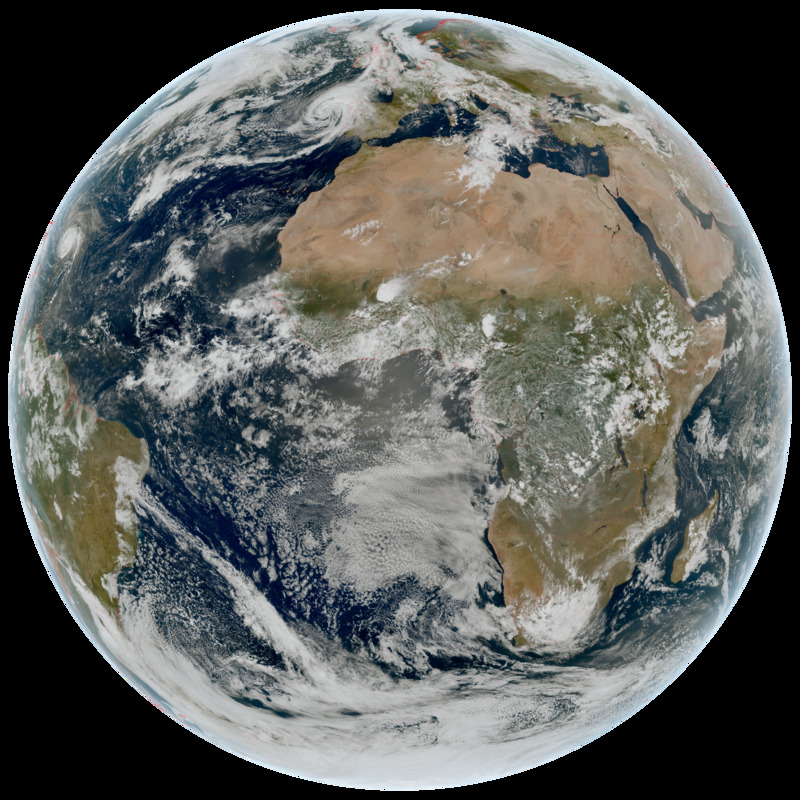

In [33]:
im = Image.open(filename + '_min.jpg')
display(im)

In [34]:
!echo {filename}_min.jpg

RESULTS/RGB_satpy_true_color_min.jpg


<div class="alert alert-info" role="alert">
    
### <a id='section2'></a>5.Création d'une image à partir d'une zone de découpe 

</div>

In [35]:
### Définition de la zone, et redimmensionnement de l'image 

In [36]:
#exemple Espagne
coord_nord = 48
coord_sud = 33
coord_ouest = -20
coord_est = 5


In [37]:
# Facteur de mise à l'échelle
scale_factor = 0.04  # 0.04 par défaut

In [38]:
#Exemple de passage en système de coordonnées géographiques (GCS) système de coordonnées WGS84 afin d'utiliser des coordonnées en degrés ("EPSG:4326", similaire à cylindrique équidistant
#Définition de la zone de découpe (étendue géographique) -te (target extent) en degrés

In [39]:
!gdalwarp -overwrite -t_srs "EPSG:4326" -te {coord_ouest} {coord_sud} {coord_est} {coord_nord}  {filename}.tif {filename}_decoupe_HD.tif
!gdalwarp -overwrite -t_srs "EPSG:4326" -te {coord_ouest} {coord_sud} {coord_est} {coord_nord}  {filename}.tif {filename}_decoupe_HD.png
!gdalwarp -overwrite -t_srs "EPSG:4326" -te {coord_ouest} {coord_sud} {coord_est} {coord_nord} {filename}.tif {filename}_decoupe_HD.jpg

Using band 4 of source image as alpha.
Creating output file that is 2184P x 1311L.
Processing RESULTS/RGB_satpy_true_color.tif [1/1] : 0...10...20...30...40...50...60...70...80...90...100 - done.
Using band 4 of source image as alpha.
Creating output file that is 2184P x 1311L.
0...10...20...30...40...50...60...70...80...90...100 - done.
Using band 4 of source image as alpha.
Creating output file that is 2184P x 1311L.
Warning 1: 4-band JPEGs will be interpreted on reading as in CMYK colorspace
0...10...20...30...40...50...60...70...80...90...100 - done.


In [40]:
### Affichage des différentes tailles de fichiers

In [41]:
!ls -lhtr {filename}_decoupe_HD.tif {filename}_decoupe_HD.png {filename}_decoupe_HD.jpg 

-rw-r--r--. 1 coster coster  11M Oct  2 14:25 RESULTS/RGB_satpy_true_color_decoupe_HD.tif
-rw-r--r--. 1 coster coster 4.6M Oct  2 14:25 RESULTS/RGB_satpy_true_color_decoupe_HD.png
-rw-r--r--. 1 coster coster 1.3M Oct  2 14:25 RESULTS/RGB_satpy_true_color_decoupe_HD.jpg


In [42]:
!identify {filename}_decoupe_HD.tif {filename}_decoupe_HD.png {filename}_decoupe_HD.jpg 

RESULTS/RGB_satpy_true_color_decoupe_HD.tif TIFF 2184x1311 2184x1311+0+0 8-bit sRGB 10.9302MiB 0.000u 0:00.000
RESULTS/RGB_satpy_true_color_decoupe_HD.png PNG 2184x1311 2184x1311+0+0 8-bit sRGB 4.53927MiB 0.000u 0:00.000
RESULTS/RGB_satpy_true_color_decoupe_HD.jpg JPEG 2184x1311 2184x1311+0+0 8-bit CMYK 1.20792MiB 0.000u 0:00.000
identify: Unknown field with tag 33550 (0x830e) encountered. `TIFFReadDirectory' @ warning/tiff.c/TIFFWarnings/928.
identify: Unknown field with tag 33922 (0x8482) encountered. `TIFFReadDirectory' @ warning/tiff.c/TIFFWarnings/928.
identify: Unknown field with tag 34735 (0x87af) encountered. `TIFFReadDirectory' @ warning/tiff.c/TIFFWarnings/928.
identify: Unknown field with tag 34736 (0x87b0) encountered. `TIFFReadDirectory' @ warning/tiff.c/TIFFWarnings/928.
identify: Unknown field with tag 34737 (0x87b1) encountered. `TIFFReadDirectory' @ warning/tiff.c/TIFFWarnings/928.


In [43]:
!convert -resize 1200 {filename}_decoupe_HD.png {filename}_decoupe_min.jpg
!ls -lhtr {filename}_decoupe_min.jpg


-rw-r--r--. 1 coster coster 312K Oct  2 14:25 RESULTS/RGB_satpy_true_color_decoupe_min.jpg


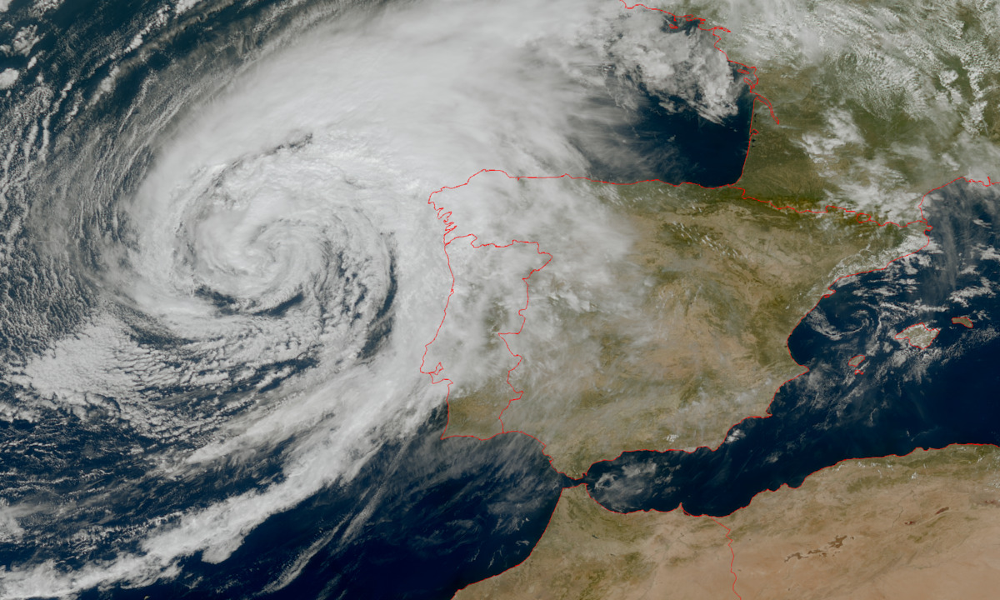

In [44]:
im2 = Image.open(filename + '_decoupe_min.jpg')
display(im2)

<div class="alert alert-info" role="alert">
    
### <a id='section2'></a>6. Reprojection de l'image

</div>


#### Définition de la reprojection et de la zone de découpe de l'image à reprojeter

In [45]:
#Exemple pour la projection orthographique ("ortho"):
#Modification des coordonnées du centre de l'image lat et lon
#Définition du redimmensionnent de l'image (facultatif) en spécifiant la largeur et la hauteur : option -ts (target size) en pixels
#Définition de la zone de découpe (étendue géographique) -te (target extent) en mètres
#Attention à conserver les proportions largeur/hauteur entre les options -ts et -te


In [46]:
!gdalwarp -q -overwrite -t_srs "+proj=ortho +lat_0=41 +lon_0=-9" -ts 3200 1800 -te -1600000 -900000 1600000 900000 {filename}.tif {filename}_ortho.jpg

Warning 1: 4-band JPEGs will be interpreted on reading as in CMYK colorspace


In [47]:
!convert -resize 800 {filename}_ortho.jpg {filename}_ortho_min.png

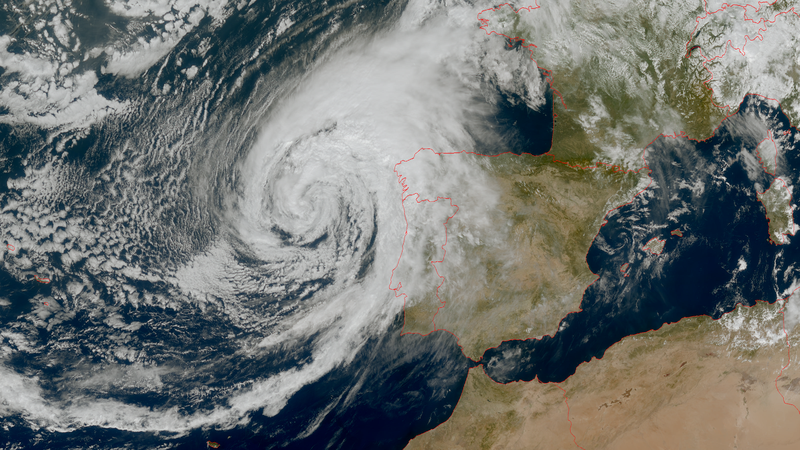

In [48]:
im3 = Image.open(filename + '_ortho_min.png')
display(im3)

### Nettoyage

In [49]:
!rm {output}/*xml #{output}/*.tif

In [50]:
#!rm -f {output}/*